## Import libraries

In [3]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [4]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
from skimage.metrics import structural_similarity as ssim
print(tf.__version__)

2.12.0


In [5]:
# Import other libraries
from tensorflow.keras.applications.efficientnet import preprocess_input
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

## Statistical Analysis

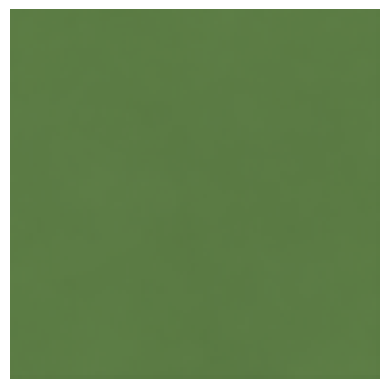

In [11]:
# plot the average image
plt.imshow(np.mean(images, axis=0))
plt.axis('off')
plt.show()

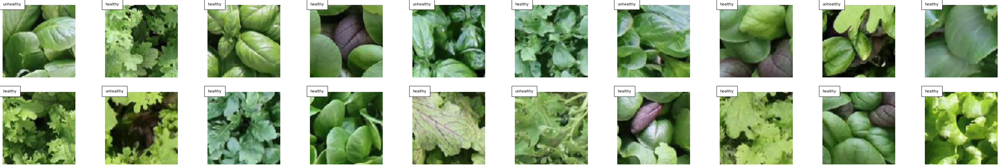

In [12]:
# Number of images to display
num_img = 20
start = 4500

# Create subplots for displaying items
fig, axes = plt.subplots(2, num_img//2, figsize=(50, 8))
for i in range(start, start + num_img):
    ax = axes[i%2, i%num_img//2]
    ax.imshow(np.clip(images[i], 0, 255))  # Display clipped item images
    ax.text(0, 0, f'{labels[i]}', bbox={'facecolor': 'white', 'pad': 10})
    ax.axis('off')
plt.show()

In [41]:
len(healthy_idx), len(unhealthy_idx)

(3060, 1790)

In [15]:
np.mean(images[healthy_idx], axis=0).shape

(96, 96, 3)

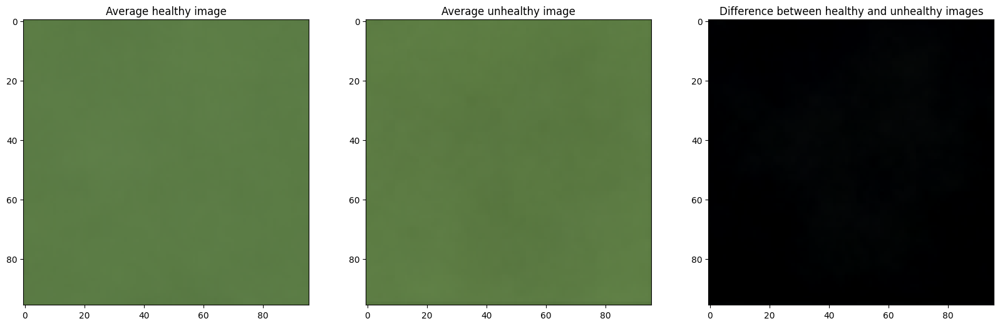

In [16]:
healthy_mean = np.mean(images[healthy_idx], axis=0)
unhealthy_mean = np.mean(images[unhealthy_idx], axis=0)

# plot average healthy and unhealthy images

fig, axes = plt.subplots(1, 3, figsize=(20, 8))

axes[0].imshow(np.clip(healthy_mean, 0, 255))
axes[0].set_title('Average healthy image')

axes[1].imshow(np.clip(unhealthy_mean, 0, 255))
axes[1].set_title('Average unhealthy image')

axes[2].imshow(np.clip(healthy_mean - unhealthy_mean, 0, 255))
axes[2].set_title('Difference between healthy and unhealthy images')

plt.show()

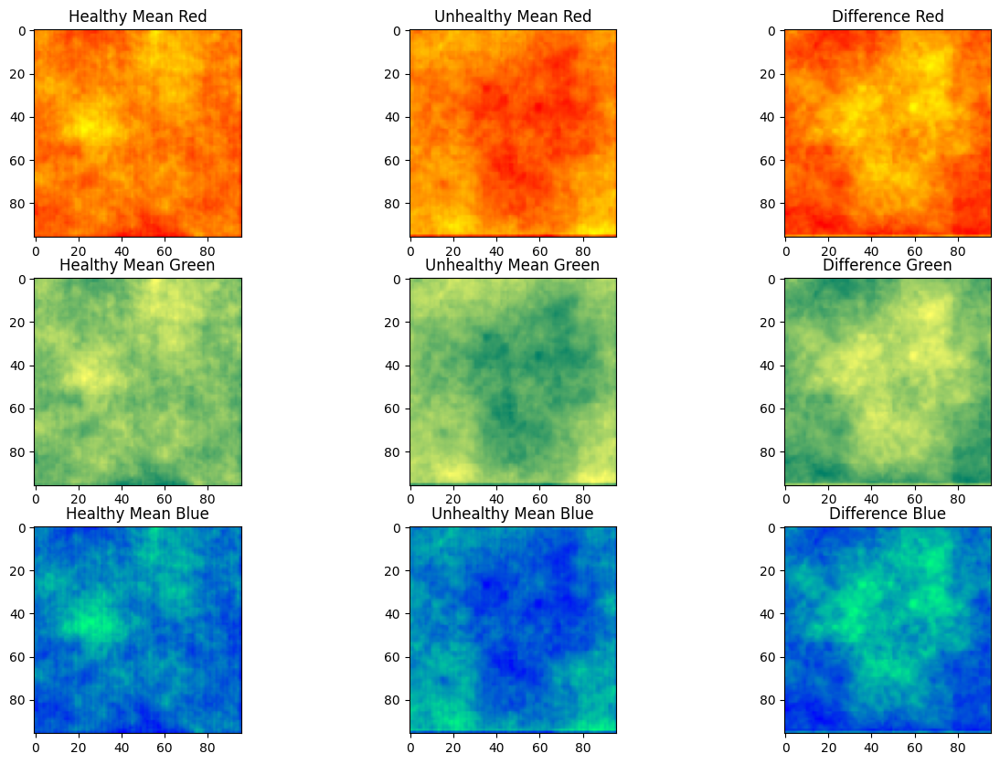

In [17]:
# show channel 0 of healthy and unhealthy mean
fig, axes = plt.subplots(3, 3, figsize=(15, 10))
axes = axes.flatten()
axes[0].imshow(healthy_mean[:, :, 0], cmap='autumn')
axes[0].set_title('Healthy Mean Red')

axes[1].imshow(unhealthy_mean[:, :, 0], cmap='autumn')
axes[1].set_title('Unhealthy Mean Red')

axes[2].imshow(healthy_mean[:, :, 0] - unhealthy_mean[:, :, 0], cmap='autumn')
axes[2].set_title('Difference Red')

axes[3].imshow(healthy_mean[:, :, 1], cmap='summer')
axes[3].set_title('Healthy Mean Green')

axes[4].imshow(unhealthy_mean[:, :, 1], cmap='summer')
axes[4].set_title('Unhealthy Mean Green')

axes[5].imshow(healthy_mean[:, :, 1] - unhealthy_mean[:, :, 1], cmap='summer')
axes[5].set_title('Difference Green')

axes[6].imshow(healthy_mean[:, :, 2], cmap='winter')
axes[6].set_title('Healthy Mean Blue')

axes[7].imshow(unhealthy_mean[:, :, 2], cmap='winter')
axes[7].set_title('Unhealthy Mean Blue')

axes[8].imshow(healthy_mean[:, :, 2] - unhealthy_mean[:, :, 2], cmap='winter')
axes[8].set_title('Difference Blue')


plt.show()

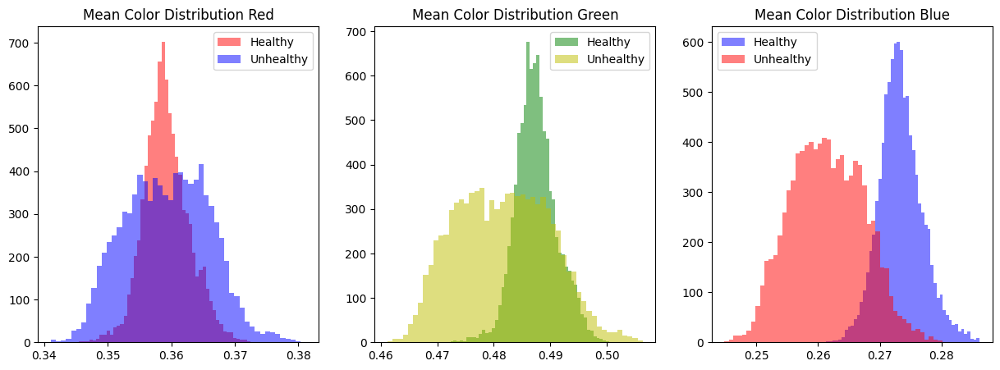

In [18]:
# mean color distribution

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].hist(healthy_mean[:, :, 0].flatten(), bins=50, color='r', alpha=0.5, label='Healthy')
axes[0].hist(unhealthy_mean[:, :, 0].flatten(), bins=50, color='b', alpha=0.5, label='Unhealthy')
axes[0].set_title('Mean Color Distribution Red')
axes[0].legend()

axes[1].hist(healthy_mean[:, :, 1].flatten(), bins=50, color='g', alpha=0.5, label='Healthy')
axes[1].hist(unhealthy_mean[:, :, 1].flatten(), bins=50, color='y', alpha=0.5, label='Unhealthy')
axes[1].set_title('Mean Color Distribution Green')
axes[1].legend()

axes[2].hist(healthy_mean[:, :, 2].flatten(), bins=50, color='b', alpha=0.5, label='Healthy')
axes[2].hist(unhealthy_mean[:, :, 2].flatten(), bins=50, color='r', alpha=0.5, label='Unhealthy')
axes[2].set_title('Mean Color Distribution Blue')
axes[2].legend()

plt.show()


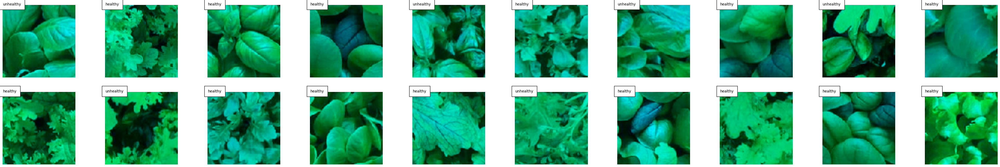

In [19]:
# show images with only blue and green channel active
# Number of images to display
num_img = 20
start = 4500

# Create subplots for displaying items
fig, axes = plt.subplots(2, num_img//2, figsize=(50, 8))
for i in range(start, start + num_img):
    ax = axes[i%2, i%num_img//2]
    image = images[i].copy()
    image[:, :, 0] = 0
    ax.imshow(np.clip(image, 0, 255))  # Display clipped item images
    ax.text(0, 0, f'{labels[i]}', bbox={'facecolor': 'white', 'pad': 10})
    ax.axis('off')

plt.show()

In [43]:
healthy_images = images[healthy_idx]
unhealthy_images = images[unhealthy_idx]

In [21]:
def signal_to_noise_ratio(a, axis=0, ddof=0):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m/sd)


In [22]:
signal_to_noise_ratio_healthy = signal_to_noise_ratio(healthy_images, axis=(1, 2))
signal_to_noise_ratio_unhealthy = signal_to_noise_ratio(unhealthy_images, axis=(1, 2))

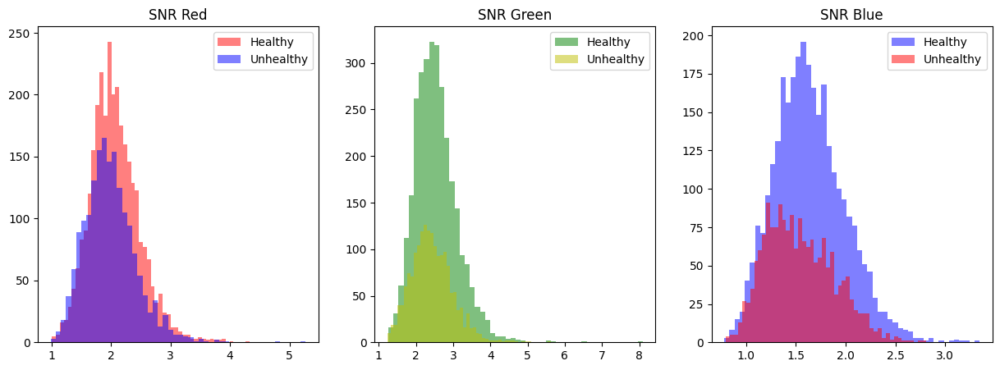

In [23]:
# plot signal to noise ratio per channel per label
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes = axes.flatten()

axes[0].hist(signal_to_noise_ratio_healthy[:, 0], bins=50, color='r', alpha=0.5, label='Healthy')
axes[0].hist(signal_to_noise_ratio_unhealthy[:, 0], bins=50, color='b', alpha=0.5, label='Unhealthy')
axes[0].set_title('SNR Red')

axes[1].hist(signal_to_noise_ratio_healthy[:, 1], bins=50, color='g', alpha=0.5, label='Healthy')
axes[1].hist(signal_to_noise_ratio_unhealthy[:, 1], bins=50, color='y', alpha=0.5, label='Unhealthy')
axes[1].set_title('SNR Green')

axes[2].hist(signal_to_noise_ratio_healthy[:, 2], bins=50, color='b', alpha=0.5, label='Healthy')
axes[2].hist(signal_to_noise_ratio_unhealthy[:, 2], bins=50, color='r', alpha=0.5, label='Unhealthy')
axes[2].set_title('SNR Blue')

axes[0].legend()
axes[1].legend()
axes[2].legend()

plt.show()


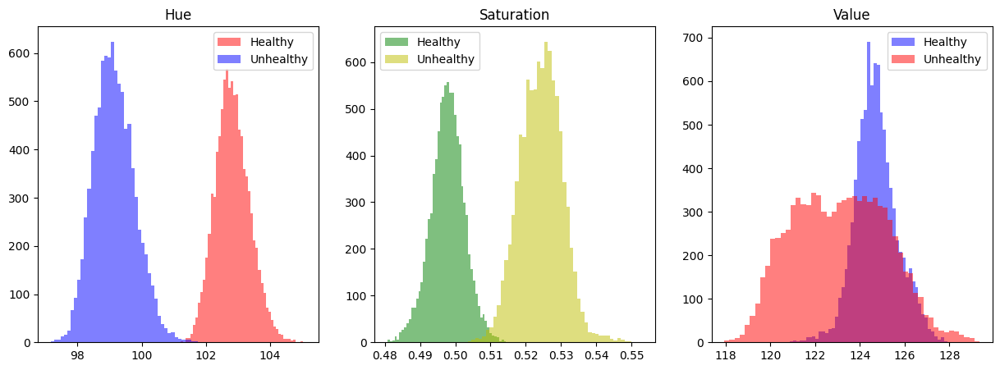

In [45]:
import cv2
# check if HSV color space is better for classification

healthy_hsv = np.array([cv2.cvtColor(image, cv2.COLOR_RGB2HSV) for image in healthy_images])
unhealthy_hsv = np.array([cv2.cvtColor(image, cv2.COLOR_RGB2HSV) for image in unhealthy_images])

healthy_hsv_mean = np.mean(healthy_hsv, axis=0)
unhealthy_hsv_mean = np.mean(unhealthy_hsv, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes = axes.flatten()

axes[0].hist(healthy_hsv_mean[:, :, 0].flatten(), bins=50, color='r', alpha=0.5, label='Healthy')
axes[0].hist(unhealthy_hsv_mean[:, :, 0].flatten(), bins=50, color='b', alpha=0.5, label='Unhealthy')
axes[0].set_title('Hue')

axes[1].hist(healthy_hsv_mean[:, :, 1].flatten(), bins=50, color='g', alpha=0.5, label='Healthy')
axes[1].hist(unhealthy_hsv_mean[:, :, 1].flatten(), bins=50, color='y', alpha=0.5, label='Unhealthy')
axes[1].set_title('Saturation')

axes[2].hist(healthy_hsv_mean[:, :, 2].flatten(), bins=50, color='b', alpha=0.5, label='Healthy')
axes[2].hist(unhealthy_hsv_mean[:, :, 2].flatten(), bins=50, color='r', alpha=0.5, label='Unhealthy')
axes[2].set_title('Value')

axes[0].legend()
axes[1].legend()
axes[2].legend()

plt.show()

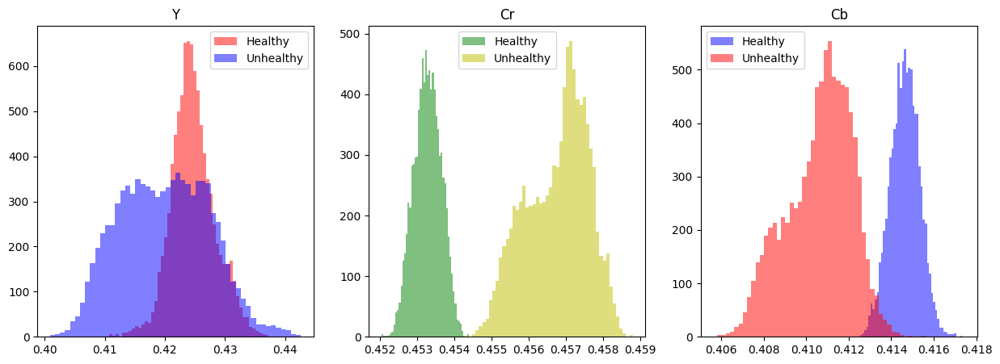

In [25]:
# check if YCrCb color space is better for classification

healthy_ycrcb = np.array([cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb) for image in healthy_images])
unhealthy_ycrcb = np.array([cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb) for image in unhealthy_images])

healthy_ycrcb_mean = np.mean(healthy_ycrcb, axis=0)
unhealthy_ycrcb_mean = np.mean(unhealthy_ycrcb, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes = axes.flatten()

axes[0].hist(healthy_ycrcb_mean[:, :, 0].flatten(), bins=50, color='r', alpha=0.5, label='Healthy')
axes[0].hist(unhealthy_ycrcb_mean[:, :, 0].flatten(), bins=50, color='b', alpha=0.5, label='Unhealthy')
axes[0].set_title('Y')

axes[1].hist(healthy_ycrcb_mean[:, :, 1].flatten(), bins=50, color='g', alpha=0.5, label='Healthy')
axes[1].hist(unhealthy_ycrcb_mean[:, :, 1].flatten(), bins=50, color='y', alpha=0.5, label='Unhealthy')
axes[1].set_title('Cr')

axes[2].hist(healthy_ycrcb_mean[:, :, 2].flatten(), bins=50, color='b', alpha=0.5, label='Healthy')
axes[2].hist(unhealthy_ycrcb_mean[:, :, 2].flatten(), bins=50, color='r', alpha=0.5, label='Unhealthy')
axes[2].set_title('Cb')

axes[0].legend()
axes[1].legend()
axes[2].legend()

plt.show()

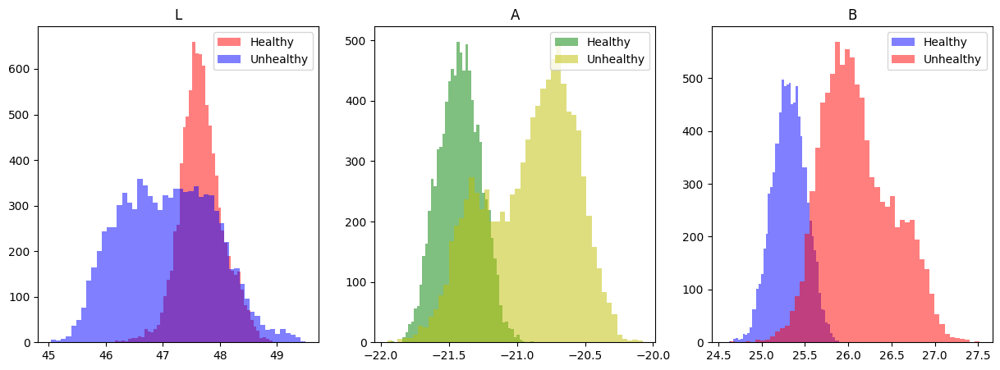

In [26]:
# check if LAB color space is better for classification

healthy_lab = np.array([cv2.cvtColor(image, cv2.COLOR_RGB2LAB) for image in healthy_images])
unhealthy_lab = np.array([cv2.cvtColor(image, cv2.COLOR_RGB2LAB) for image in unhealthy_images])

healthy_lab_mean = np.mean(healthy_lab, axis=0)
unhealthy_lab_mean = np.mean(unhealthy_lab, axis=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes = axes.flatten()

axes[0].hist(healthy_lab_mean[:, :, 0].flatten(), bins=50, color='r', alpha=0.5, label='Healthy')
axes[0].hist(unhealthy_lab_mean[:, :, 0].flatten(), bins=50, color='b', alpha=0.5, label='Unhealthy')
axes[0].set_title('L')

axes[1].hist(healthy_lab_mean[:, :, 1].flatten(), bins=50, color='g', alpha=0.5, label='Healthy')
axes[1].hist(unhealthy_lab_mean[:, :, 1].flatten(), bins=50, color='y', alpha=0.5, label='Unhealthy')
axes[1].set_title('A')

axes[2].hist(healthy_lab_mean[:, :, 2].flatten(), bins=50, color='b', alpha=0.5, label='Healthy')
axes[2].hist(unhealthy_lab_mean[:, :, 2].flatten(), bins=50, color='r', alpha=0.5, label='Unhealthy')
axes[2].set_title('B')

axes[0].legend()
axes[1].legend()
axes[2].legend()

plt.show()

## Noise experiments

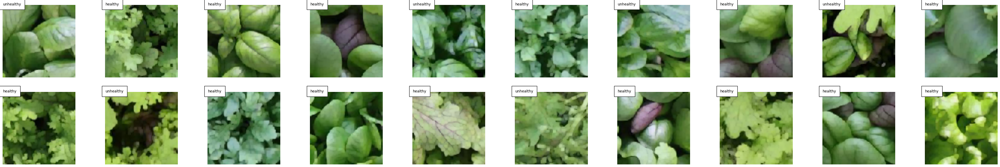

In [27]:
# remove noise from images via erosion and dilation

# Number of images to display
num_img = 20
start = 4500

# Create subplots for displaying items
fig, axes = plt.subplots(2, num_img//2, figsize=(50, 8))
for i in range(start, start + num_img):
    ax = axes[i%2, i%num_img//2]
    image = images[i].copy()
    image = cv2.erode(image, np.ones((3, 3), np.uint8), iterations=1)
    image = cv2.dilate(image, np.ones((3, 3), np.uint8), iterations=1)
    ax.imshow(np.clip(image, 0, 255))  # Display clipped item images
    ax.text(0, 0, f'{labels[i]}', bbox={'facecolor': 'white', 'pad': 10})
    ax.axis('off')
    
plt.show()

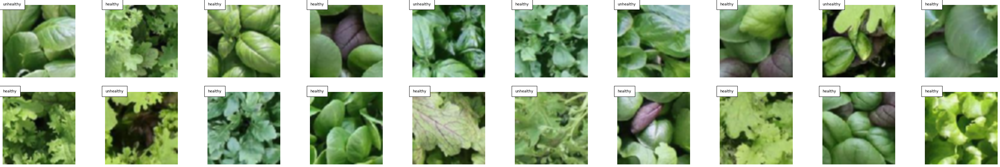

In [28]:
# blur images with gaussian blur

# Number of images to display
num_img = 20
start = 4500

# Create subplots for displaying items
fig, axes = plt.subplots(2, num_img//2, figsize=(50, 8))
for i in range(start, start + num_img):
    ax = axes[i%2, i%num_img//2]
    image = images[i].copy()
    image = cv2.GaussianBlur(image, (3, 3), 0)
    ax.imshow(np.clip(image, 0, 255))  # Display clipped item images
    ax.text(0, 0, f'{labels[i]}', bbox={'facecolor': 'white', 'pad': 10})
    ax.axis('off')

plt.show()

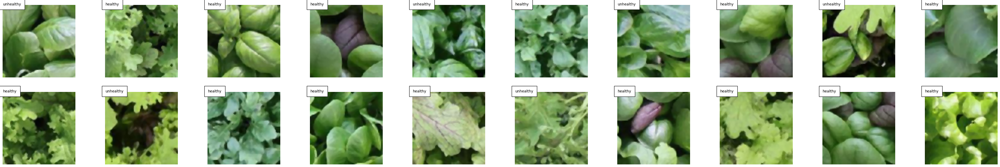

In [29]:
# blur images with median blur

# Number of images to display
num_img = 20
start = 4500

# Create subplots for displaying items
fig, axes = plt.subplots(2, num_img//2, figsize=(50, 8))
for i in range(start, start + num_img):
    ax = axes[i%2, i%num_img//2]
    image = images[i].copy()
    image = cv2.medianBlur(image, 3)
    ax.imshow(np.clip(image, 0, 255))  # Display clipped item images
    ax.text(0, 0, f'{labels[i]}', bbox={'facecolor': 'white', 'pad': 10})
    ax.axis('off')
    
plt.show()

In [30]:
images.shape

(4850, 96, 96, 3)

In [20]:
# imagine images is a tensor in a preprocessing pipeline in a tensorflow model
# define the call method to apply CLAHE to the inputs
def call(inputs):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    for i in range(inputs.shape[0]):
        # convert to LAB color space
        image = cv2.cvtColor(inputs[i], cv2.COLOR_RGB2LAB)
        # apply CLAHE to the L channel
        image[:, :, 0] = clahe.apply(image[:, :, 0])
        # convert back to RGB color space
        inputs[i] = cv2.cvtColor(image, cv2.COLOR_LAB2RGB)
    return inputs

In [19]:
import cv2

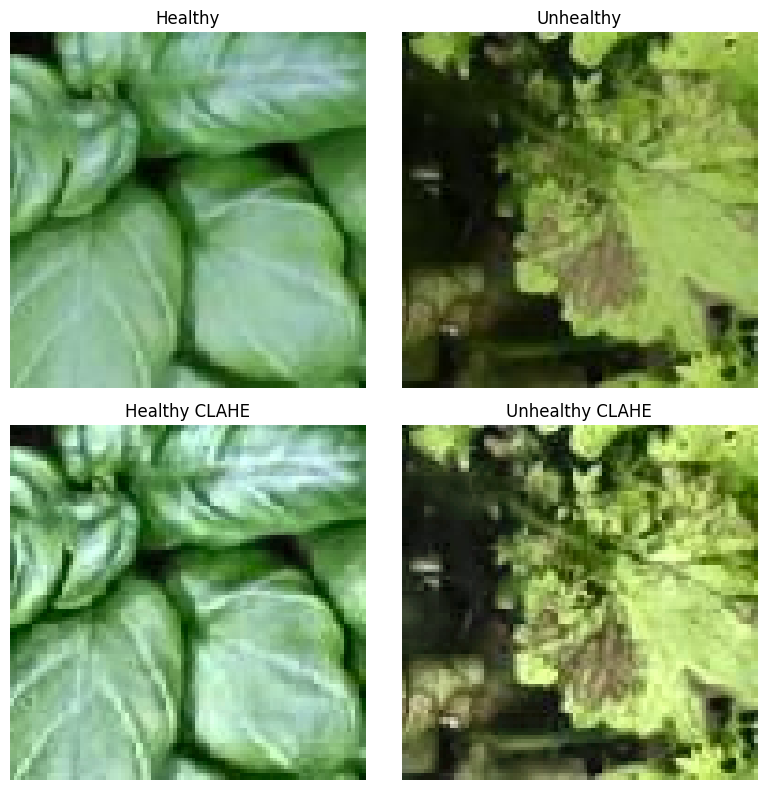

In [37]:
# get one healthy and one unhealthy image
healthy_image = images[labels == 'healthy'][4]
unhealthy_image = images[labels == 'unhealthy'][5]
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

healthy_image_clahe = healthy_image.copy()
# convert to LAB color space
lab = cv2.cvtColor(healthy_image_clahe.astype(np.uint8), cv2.COLOR_RGB2LAB)
lab[:,:,0] = clahe.apply(lab[:,:,0])
# Converting image from LAB Color model to BGR color space
healthy_image_clahe = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

unhealthy_image_clahe = unhealthy_image.copy()
# convert to LAB color space
lab = cv2.cvtColor(unhealthy_image_clahe.astype(np.uint8), cv2.COLOR_RGB2LAB)
lab[:,:,0] = clahe.apply(lab[:,:,0])
# Converting image from LAB Color model to BGR color space
unhealthy_image_clahe = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

# apply CLAHE to the images, and plot the comparison to the original images
fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes = axes.flatten()

axes[0].imshow(healthy_image.astype(np.uint8))
axes[0].set_title('Healthy')

axes[1].imshow(unhealthy_image.astype(np.uint8))
axes[1].set_title('Unhealthy')

axes[2].imshow(healthy_image_clahe.astype(np.uint8))
axes[2].set_title('Healthy CLAHE')

axes[3].imshow(unhealthy_image_clahe.astype(np.uint8))
axes[3].set_title('Unhealthy CLAHE')

for ax in axes:
    ax.set_axis_off()

plt.tight_layout()
plt.show()

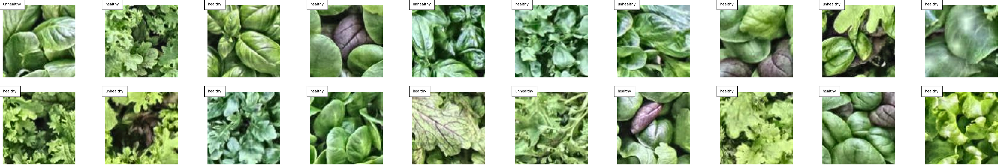

In [27]:
# apply histogram equalization to images

# Number of images to display
num_img = 20
start = 4500

# Create subplots for displaying items
fig, axes = plt.subplots(2, num_img//2, figsize=(50, 8))
for i in range(start, start + num_img):
    ax = axes[i%2, i%num_img//2]
    image = images[i].copy() * 255
    # convert to LAB color space
    lab = cv2.cvtColor(image.astype(np.uint8), cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    lab[:,:,0] = clahe.apply(lab[:,:,0])
    # Converting image from LAB Color model to BGR color space
    enhanced_img = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    # Stacking the original image with the enhanced image
    ax.imshow(enhanced_img)  # Display clipped item images
    ax.text(0, 0, f'{labels[i]}', bbox={'facecolor': 'white', 'pad': 10})
    ax.axis('off')
    
plt.show()